# Milk Data File

# Libraries

In [1]:
# Loading libraries
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings(action='ignore')
from datetime import datetime
import datetime as dt
import os
import re

# Part 1: Data Manipulation and Missing Values Imputation 

In [2]:
# Loading Raw Milk Data File
df = pd.read_excel('milk.xlsx')

In [3]:
# First five rows of raw milk data file
df.head()

,Cow ID,Lactation No,Parity,DIM,Date,Calving Date,Calving Time,Last AI Date,Milk,Conductivity,...,Calving Season,Activity,Rest Time,Rest Per Bout,Restlessness Ratio,Days Pregnancy,Days Dry off,Calving Manner,Offspring Amount,Breed
0,3,1,1,0,2019-12-24,2021-12-24,08:04:00,2021-03-16,18.0,10.8,...,Winter,204,481,27,3.5,283,61.0,Normal,1,HF
1,3,1,1,1,2019-12-25,2021-12-24,08:04:00,2021-03-16,15.7,9.8,...,Winter,240,453,45,5.0,283,61.0,Normal,1,HF
2,3,1,1,2,2019-12-26,2021-12-24,08:04:00,2021-03-16,16.3,10.9,...,Winter,304,481,25,5.6,283,61.0,Normal,1,HF
3,3,1,1,3,2019-12-27,2021-12-24,08:04:00,2021-03-16,16.5,10.0,...,Winter,155,547,26,2.9,283,61.0,Normal,1,HF
4,3,1,1,4,2019-12-28,2021-12-24,08:04:00,2021-03-16,17.9,9.1,...,Winter,178,528,33,3.3,283,61.0,Normal,1,HF


In [4]:
# List of columns and variables inside raw milk data file
df.columns

Index(['Cow ID', 'Lactation No', 'Parity', 'DIM', 'Date', 'Calving Date',
       'Calving Time', 'Last AI Date', 'Milk', 'Conductivity', 'AMT',
       'Heat Indicator', 'DIM At Heat By Sensor (Heat Index) After Calving',
       'DIM At First Service After Calving', 'First Service After Calving',
       'DIM At Last Service After Calving', 'No of Service Per Conception',
       'DIM At Conception After Calving', 'DIM At First Sick',
       'Health Problem At The First Sick', 'DIM At Second Sick',
       'Health Problem At Second Sick', 'Calving Season', 'Activity',
       'Rest Time', 'Rest Per Bout', 'Restlessness Ratio', 'Days Pregnancy',
       'Days Dry off', 'Calving Manner', 'Offspring Amount', 'Breed'],
      dtype='object')

In [5]:
# Shape of data set: 69462 rows and 32 variables/columns
df.shape

(69462, 32)

In [6]:
# Checking missing values
df.isnull().sum().sort_values(ascending=False)

Days Dry off                                        52912
Health Problem At Second Sick                       49879
DIM At Second Sick                                  49879
DIM At First Sick                                   27847
Health Problem At The First Sick                    27847
DIM At Conception After Calving                      8874
Milk                                                 1472
DIM At Last Service After Calving                    1224
First Service After Calving                          1224
DIM At First Service After Calving                   1224
No of Service Per Conception                         1224
Calving Season                                          0
Activity                                                0
Rest Per Bout                                           0
Restlessness Ratio                                      0
Days Pregnancy                                          0
Calving Manner                                          0
Offspring Amou

# Part 01 (a): Cleaning Section

# Libraries

In [7]:
# Loading libraries
import numpy as np
import pandas as pd
from scipy.optimize import curve_fit
from scipy.integrate import quad
from tqdm import tqdm

# Conversion of Data Type for Milk variable

In [8]:
# Conversion of Milk variable into numeric data types
df['Milk'] = pd.to_numeric(df['Milk'], errors = 'coerce')

# Wood Model

In [9]:
# Defining Wood Model
def woods_curve(t, a, b, c):
    return a * t**b * np.exp(-c * t)

# Fitting the wood model

In [10]:
# Fitting the Wood model to the data variables available
observed_data = df.dropna(subset=['Milk'])
# Fitting the wood model lactation curve on the variables
popt, _ = curve_fit(woods_curve, observed_data['DIM'], observed_data['Milk'], maxfev=10000)

# Predicting Milk Yield Through Wood Model

In [11]:
# Predicting the milk yield
df['Milk_Predicted'] = woods_curve(df['DIM'], *popt)

# Imputating Missing values in variable: "Milk" through calcuated Predicted Milk

In [12]:
# Filling missing values in the 'Milk' column with predicted values
df['Milk'].fillna(df['Milk_Predicted'], inplace=True)

# Dropping Predicted Milk variable

In [13]:
# Droping the 'Milk_Predicted' variable
df.drop(columns=['Milk_Predicted'], inplace=True)

# Saving Results with Imputed values in Milk variable

In [14]:
# Saving results
df.to_excel('milk.data.updated.xlsx', index=False)

# Visualization

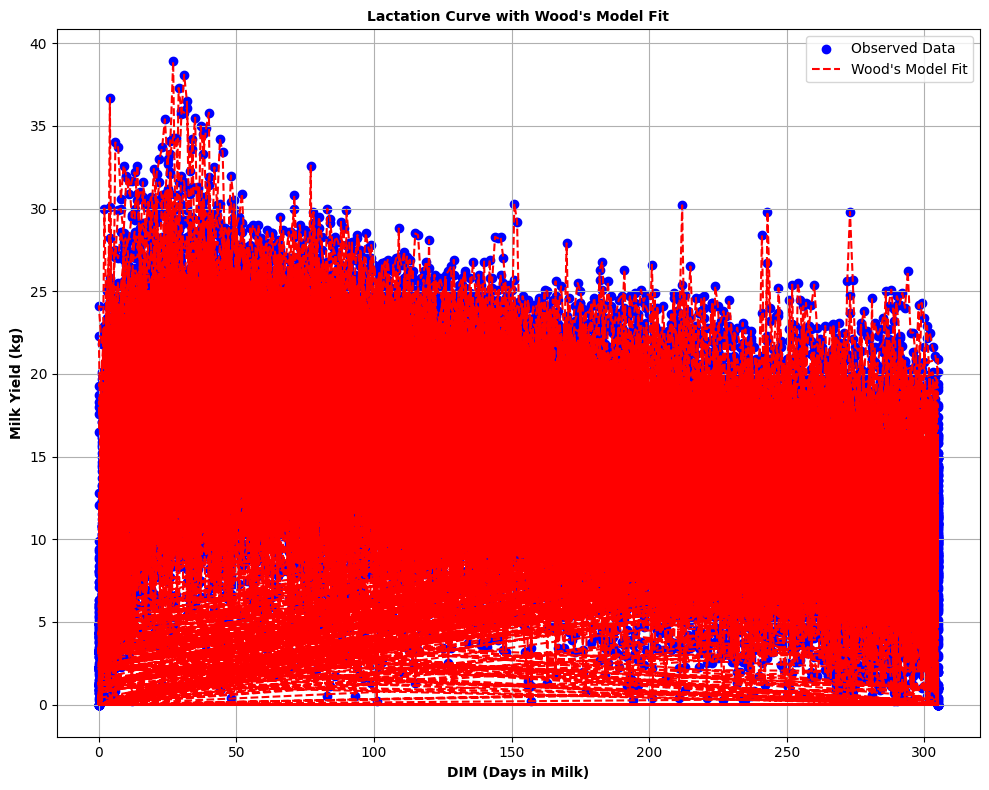

In [15]:
# Setting the figure size
plt.figure(figsize=(10, 8))

# Sactter plot
plt.scatter(observed_data['DIM'], observed_data['Milk'], label='Observed Data', color='blue')
# Line plot
plt.plot(df['DIM'], df['Milk'], label='Wood\'s Model Fit', color='red', linestyle='--')

# Lable, title, and legend
plt.xlabel('DIM (Days in Milk)', fontsize = 10, weight='bold')
plt.ylabel('Milk Yield (kg)', fontsize=10, weight='bold')
plt.title('Lactation Curve with Wood\'s Model Fit', fontsize = 10, weight = 'bold')
plt.legend()
plt.grid(True)

# Setting the tight layout to avoid overlapping
plt.tight_layout()
# Display the figure
plt.show()

# Part 02: Lactation Curve Per Cow 

## Loading Data Set

In [16]:
# loading imputed milk data set
data = pd.read_excel('milk.data.updated.xlsx')

In [17]:
# First five rows of data set
data.head()

,Cow ID,Lactation No,Parity,DIM,Date,Calving Date,Calving Time,Last AI Date,Milk,Conductivity,...,Calving Season,Activity,Rest Time,Rest Per Bout,Restlessness Ratio,Days Pregnancy,Days Dry off,Calving Manner,Offspring Amount,Breed
0,3,1,1,0,2019-12-24,2021-12-24,08:04:00,2021-03-16,18.0,10.8,...,Winter,204,481,27,3.5,283,61.0,Normal,1,HF
1,3,1,1,1,2019-12-25,2021-12-24,08:04:00,2021-03-16,15.7,9.8,...,Winter,240,453,45,5.0,283,61.0,Normal,1,HF
2,3,1,1,2,2019-12-26,2021-12-24,08:04:00,2021-03-16,16.3,10.9,...,Winter,304,481,25,5.6,283,61.0,Normal,1,HF
3,3,1,1,3,2019-12-27,2021-12-24,08:04:00,2021-03-16,16.5,10.0,...,Winter,155,547,26,2.9,283,61.0,Normal,1,HF
4,3,1,1,4,2019-12-28,2021-12-24,08:04:00,2021-03-16,17.9,9.1,...,Winter,178,528,33,3.3,283,61.0,Normal,1,HF


In [18]:
# Checking Missing values inside "Milk" Variables
data['Milk'].isnull().sum()

0

# Wood Model

In [19]:
# Wood Model
def woods_lactation_curve(DIM, a, b, c):
    return a * (DIM ** b) * np.exp(-c * DIM)

# Calculation of Peak Time, Peak Yield, Milk Persistency; and Total Milk Yield

In [20]:
# Defining a function to calculate lactation parameters
def estimate_lactation_parameters(data):
    params, _ = curve_fit(woods_lactation_curve, data['DIM'], data['Milk'], maxfev=10000)
    a, b, c = params
    
# Estimating peak time and peak yield
    peak_time = b / c
    peak_yield = woods_lactation_curve(peak_time, a, b, c)
    
# Calculation of persistency: Percentage decrease in yield from peak to 305th day
    persistency = 100 * (woods_lactation_curve(305, a, b, c) / peak_yield)
    
# Estimation of cumulative milk yield from DIM 1 to 305
    cum_milk_yield = np.trapz(woods_lactation_curve(np.arange(1, 306), a, b, c), dx=1)
    
    return a, b, c, peak_time, peak_yield, persistency, cum_milk_yield
# Milk Persistency Calculation
def calculate_persistency(peak_yield, yield_at_305):
    return (yield_at_305 / peak_yield) * 100

# Cleaning Data Set

In [21]:
# Clean the dataset (remove missing values)
cleaned_data = data.dropna(subset=['Milk'])

# Processing Data and Visualization

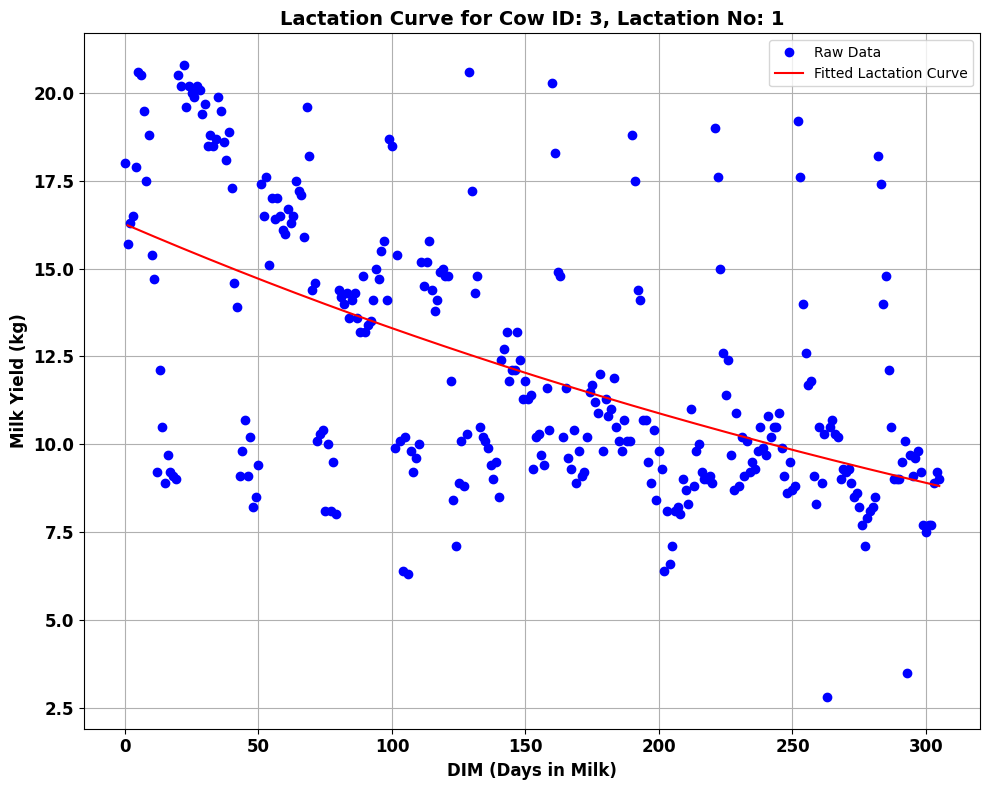

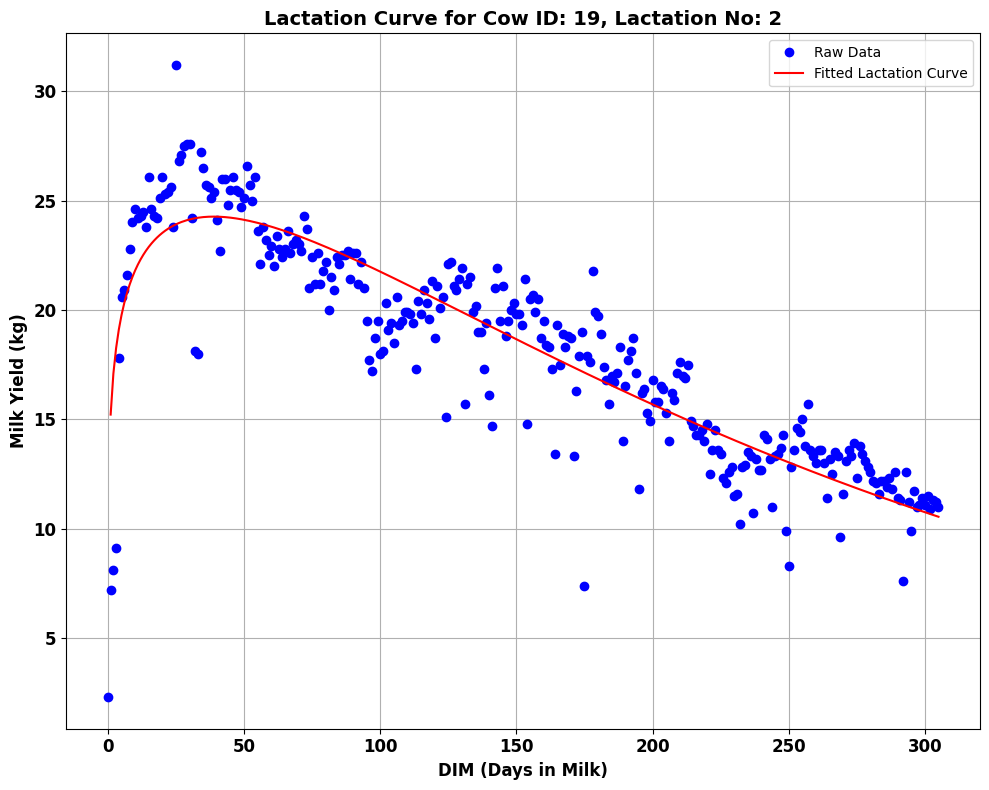

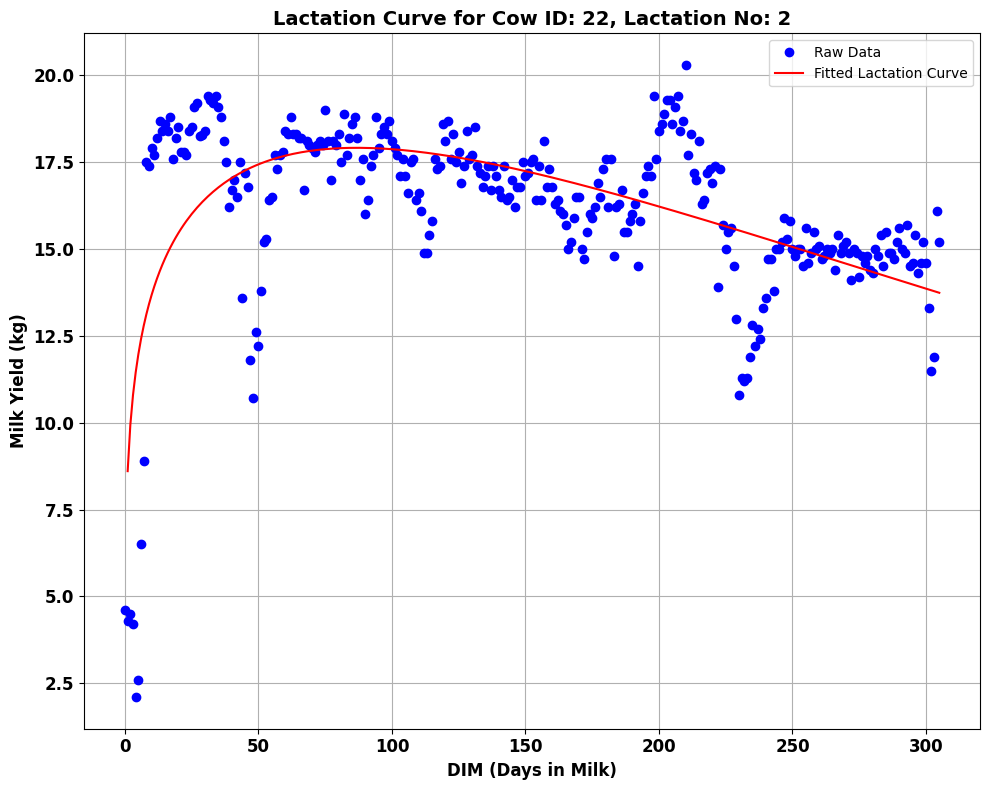

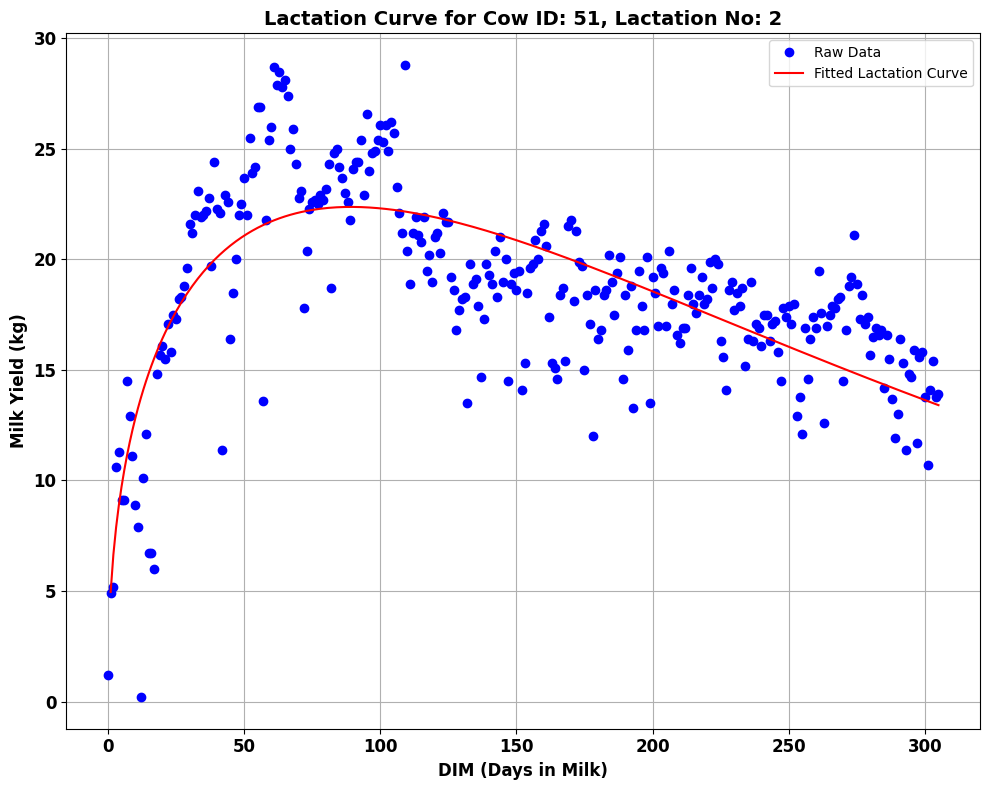

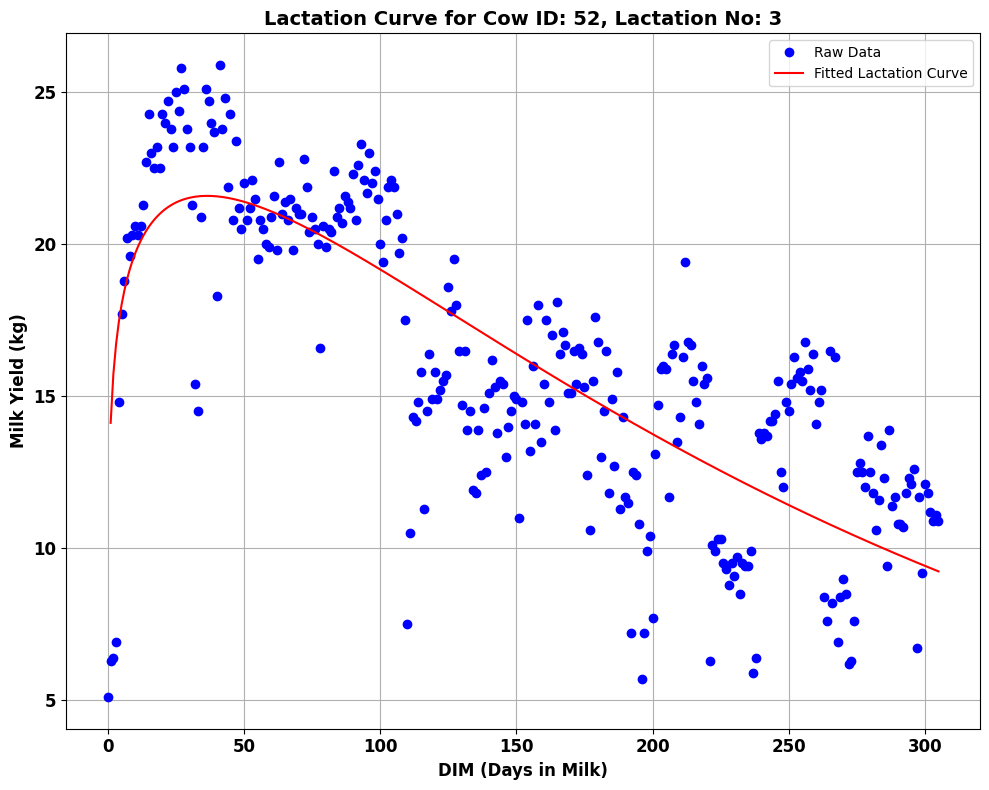

...

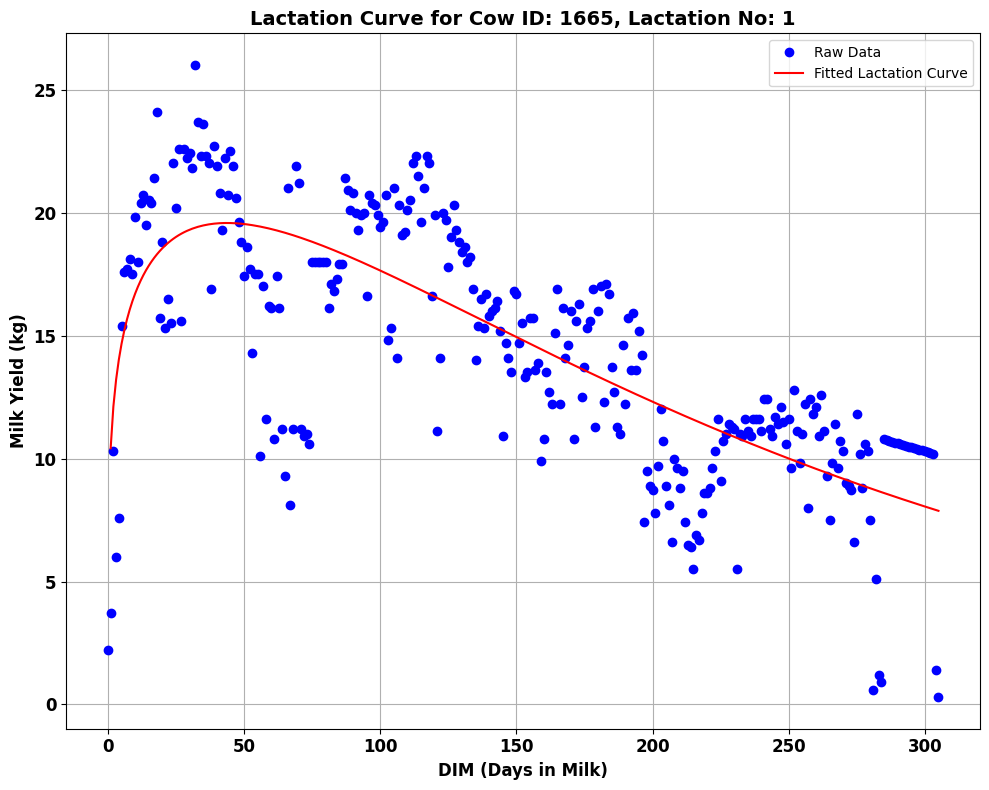

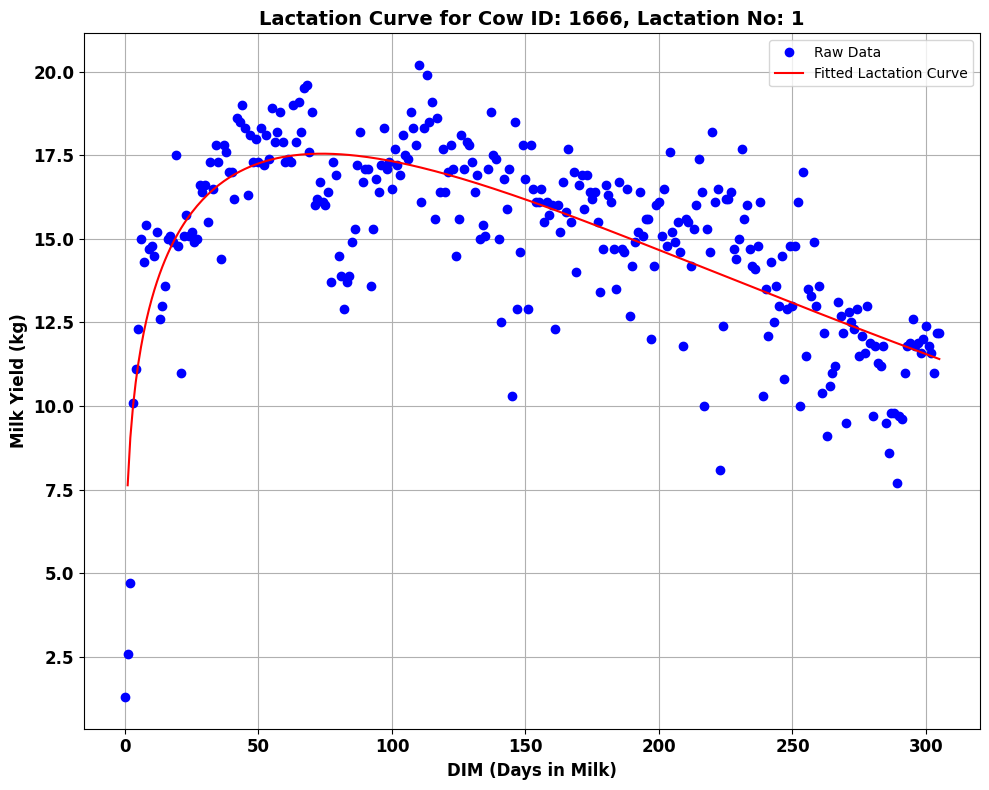

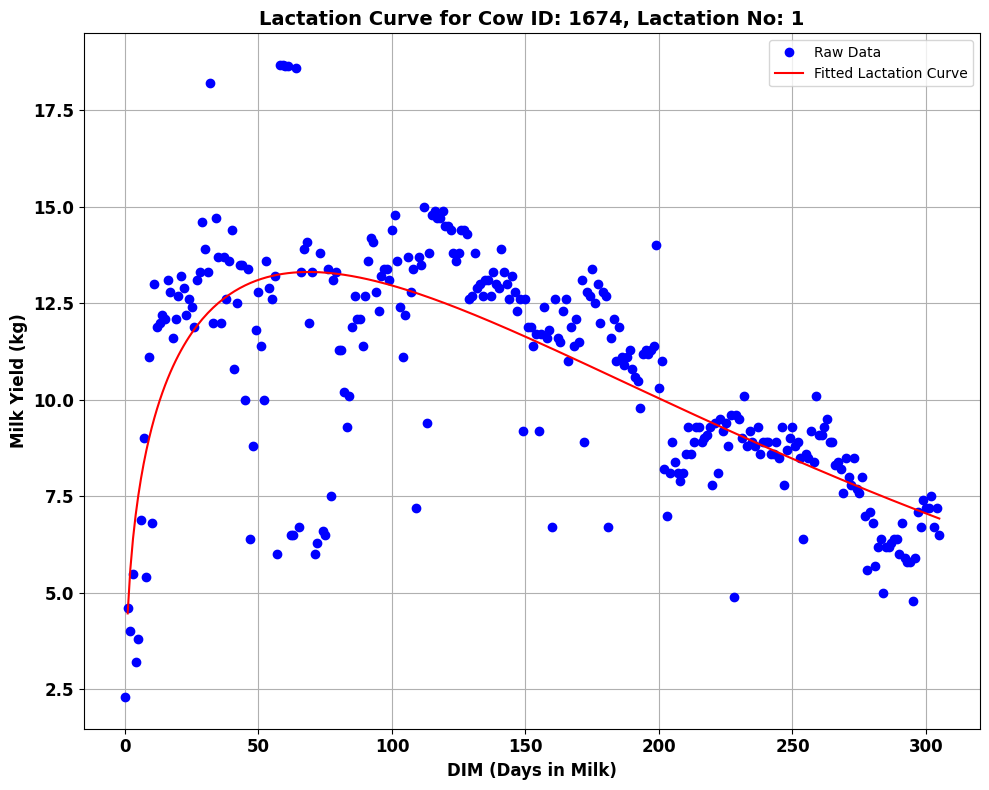

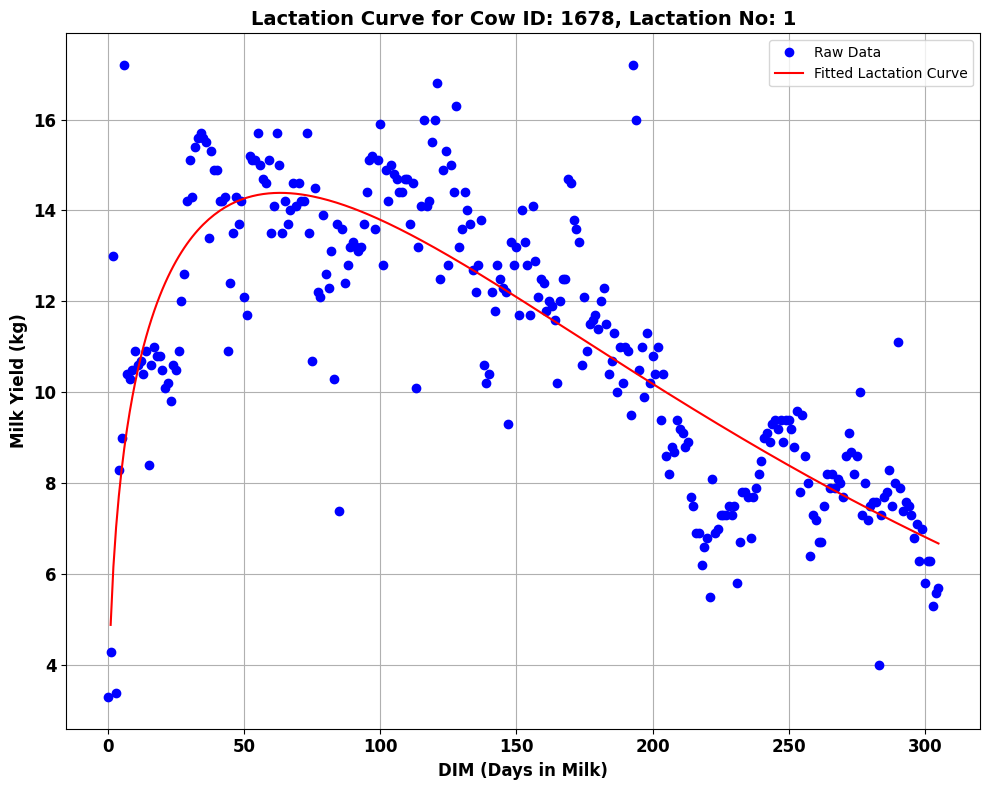

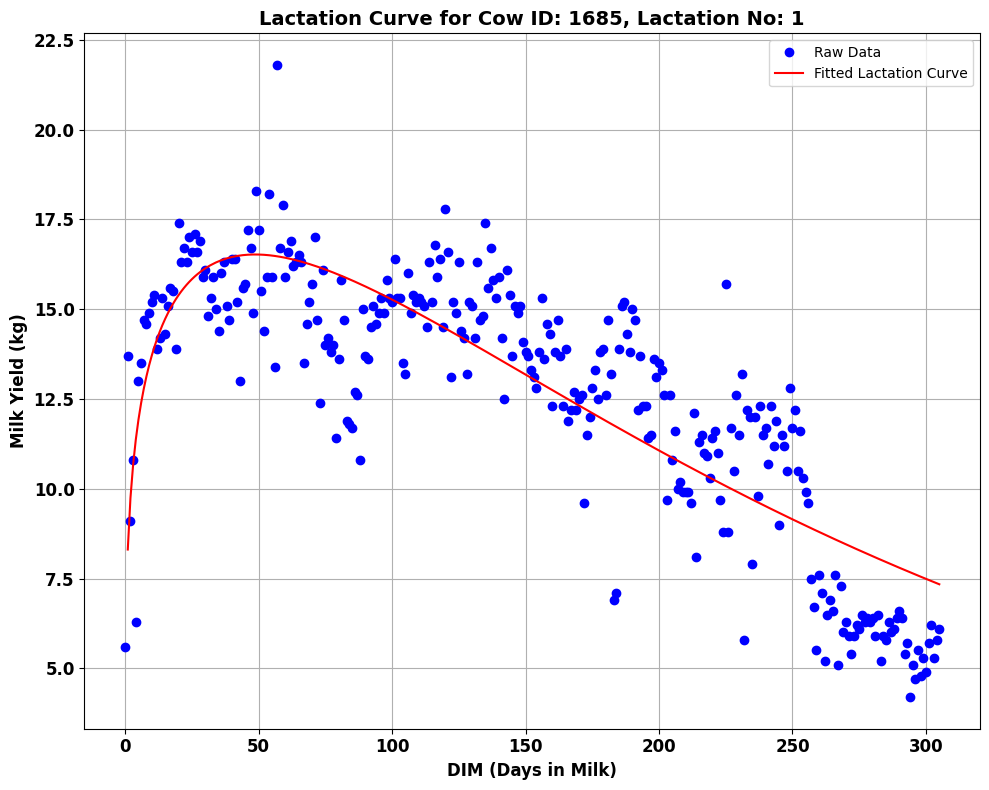

In [22]:
# For Loop to go through each cow's data, estimate the lactation parameters, and visualize them per cow
for (cow_id, lactation_no), group in data.groupby(['Cow ID', 'Lactation No']):
# Estimation of wood parameters for the current cow and lactation number
    a, b, c, peak_time, peak_yield, persistency, cum_milk_yield = estimate_lactation_parameters(group)
    
# Generating predicted values for DIM 1 to 305 using the estimated wood parameters
    dims = np.arange(1, 306)
    predicted_milk = woods_lactation_curve(dims, a, b, c)

# Plotting the raw data values and the predicted lactation curve
    plt.figure(figsize=(10, 8))
    plt.plot(group['DIM'], group['Milk'], 'bo', label='Raw Data')
    plt.plot(dims, predicted_milk, 'r-', label='Fitted Lactation Curve')
    
# Customizing the plot
    plt.title(f'Lactation Curve for Cow ID: {cow_id}, Lactation No: {lactation_no}', fontsize=14, fontweight='bold')
    plt.xlabel('DIM (Days in Milk)', fontsize=12, fontweight='bold')
    plt.ylabel('Milk Yield (kg)', fontsize=12, fontweight='bold')
    plt.xticks(fontsize=12, fontweight='bold')
    plt.yticks(fontsize=12, fontweight='bold')
    plt.legend(fontsize=10)
    plt.tight_layout()
    plt.grid(True)    
# Display the figures
    plt.show()

# Part 03: Preparation of Final Data Set

# Loading Cleaned Milk Data File

In [23]:
# Loading cleaned milk data file
data02 = pd.read_excel('milk.data.updated.xlsx')

# Wood Model

In [24]:
# Define Wood's lactation model function
def woods_lactation_curve(DIM, a, b, c):
    return a * (DIM ** b) * np.exp(-c * DIM)

# Calculation of Predicted Milk Variables at specified days 

In [25]:
# Defining a function to calculate lactation parameters using Wood's model
def estimate_lactation_parameters(data02):
    params, _ = curve_fit(woods_lactation_curve, data02['DIM'], data02['Milk'], maxfev=10000)
    a, b, c = params
    peak_time = b / c
    peak_yield = woods_lactation_curve(peak_time, a, b, c)
    persistency = 100 * (woods_lactation_curve(305, a, b, c) / peak_yield)

    cum_milk_yield_56 = np.trapz(woods_lactation_curve(np.arange(1, 57), a, b, c), dx=1)
    cum_milk_yield_84 = np.trapz(woods_lactation_curve(np.arange(1, 85), a, b, c), dx=1)
    cum_milk_yield_126 = np.trapz(woods_lactation_curve(np.arange(1, 127), a, b, c), dx=1)
    cum_milk_yield_305 = np.trapz(woods_lactation_curve(np.arange(1, 306), a, b, c), dx=1)

    return {
        'a': a, 'b': b, 'c': c, 
        'Predicted Peak Time': peak_time,
        'Predicted Peak Yield': peak_yield, 
        'Predicted_persistency': persistency, 
        'MY 56 Predicted': cum_milk_yield_56,
        'MY 84 Predicted': cum_milk_yield_84,
        'MY 126 Predicted': cum_milk_yield_126,
        'MY 305 Predicted': cum_milk_yield_305
    }

# Calculation of Reproductive and Health Variables

In [26]:
# Defining a function to calculate reproductive and health variables
def calculate_reproductive_values(group):
# Reproductive variables
    dim_1st_service = group['DIM At First Service After Calving'].min() if 'DIM At First Service After Calving' in group.columns else np.nan
    dim_at_last_service = group['DIM At First Service After Calving'].max() if 'DIM At First Service After Calving' in group.columns else np.nan
    dim_at_conception = group['DIM At Conception After Calving'].min() if 'DIM At Conception After Calving' in group.columns else np.nan

    no_of_service_per_conception = group['No of Service Per Conception'].max() if 'No of Service Per Conception' in group.columns and not np.isnan(dim_at_conception) else np.nan

    dim_at_first_heat = group['DIM At Heat By Sensor (Heat Index) After Calving'].min() if 'DIM At Heat By Sensor (Heat Index) After Calving' in group.columns else np.nan

# Health variables
    dim_at_first_sick = group['DIM At First Sick'].min() if 'DIM At First Sick' in group.columns else np.nan
    if not np.isnan(dim_at_first_sick):
        idx_first_sick = group[group['DIM At First Sick'] == dim_at_first_sick].index[0]
        health_problem_first_sick = group.loc[idx_first_sick, 'Health Problem At The First Sick'] if 'Health Problem At The First Sick' in group.columns else np.nan
    else:
        health_problem_first_sick = np.nan

    dim_at_second_sick = group['DIM At Second Sick'].min() if 'DIM At Second Sick' in group.columns else np.nan
    if not np.isnan(dim_at_second_sick):
        idx_second_sick = group[group['DIM At Second Sick'] == dim_at_second_sick].index[0]
        health_problem_second_sick = group.loc[idx_second_sick, 'Health Problem At Second Sick'] if 'Health Problem At Second Sick' in group.columns else np.nan
    else:
        health_problem_second_sick = np.nan

    return (
        dim_1st_service,
        dim_at_last_service,
        dim_at_conception,
        no_of_service_per_conception,
        dim_at_first_heat,
        dim_at_first_sick,
        health_problem_first_sick,
        dim_at_second_sick,
        health_problem_second_sick
    )

# Calculation of Observed Milk Variables at specified days and Processing Data

In [27]:
# Calculation observed milk variables for each cow
observed_results = []
for (cow_id, lactation_no), group in data.groupby(['Cow ID', 'Lactation No']):
    parity = group['Parity'].iloc[0]
    group = group.sort_values(by='DIM')
    peak_yield = group['Milk'].max()
    dim_at_peak = group.loc[group['Milk'] == peak_yield, 'DIM'].min()

    milk_at_305 = group.loc[group['DIM'] == 305, 'Milk'].values
    milk_at_305 = milk_at_305[0] if len(milk_at_305) > 0 else group['Milk'].iloc[-1]
    persistency = (milk_at_305 / peak_yield) * 100 if peak_yield != 0 else 1
    
    cum_yield_56 = group.loc[group['DIM'] <= 56, 'Milk'].sum()
    cum_yield_84 = group.loc[group['DIM'] <= 84, 'Milk'].sum()
    cum_yield_126 = group.loc[group['DIM'] <= 126, 'Milk'].sum()
    cum_yield_305 = group.loc[group['DIM'] <= 305, 'Milk'].sum()

    # Calculate reproductive and health variables
    (
        dim_1st_service,
        dim_at_last_service,
        dim_at_conception,
        no_of_service_per_conception,
        dim_at_first_heat,
        dim_at_first_sick,
        health_problem_first_sick,
        dim_at_second_sick,
        health_problem_second_sick
    ) = calculate_reproductive_values(group)

    observed_results.append({
        'Cow ID': cow_id,
        'Lactation No': lactation_no,
        'Parity': parity,
        'DIM At Peak Observed': dim_at_peak,
        'Peak Yield Observed': peak_yield,
        'Persistency Observed': persistency,
        'MY 56 Observed': cum_yield_56,
        'MY 84 Observed': cum_yield_84,
        'MY 126 Observed': cum_yield_126,
        'MY 305 Observed': cum_yield_305,
        'DIM 1st Service': dim_1st_service,
        'DIM At Last Service': dim_at_last_service,
        'DIM At Conception': dim_at_conception,
        'No of Service Per Conception': no_of_service_per_conception,
        'DIM At First Heat': dim_at_first_heat,
        'DIM At First Sick': dim_at_first_sick,
        'Health Problem First Sick': health_problem_first_sick,
        'DIM At Second Sick': dim_at_second_sick,
        'Health Problem Second Sick': health_problem_second_sick
    })

observed_df = pd.DataFrame(observed_results)

# Dropping Missing values in Milk and DIM Variables

In [28]:
# Cleaning the dataset
cleaned_data = data02.dropna(subset=['Milk', 'DIM'])

# Calculation of Predicted Milk Variables

In [29]:
# Calculation of predicted variables using Wood's model
predicted_results = []
for (cow_id, lactation_no), group in data02.groupby(['Cow ID', 'Lactation No']):
    try:
        params = estimate_lactation_parameters(group)
        params['Cow ID'] = cow_id
        params['Lactation No'] = lactation_no
        predicted_results.append(params)
    except Exception as e:
        print(f"Fitting failed for Cow ID {cow_id}, Lactation {lactation_no}: {e}")

predicted_df = pd.DataFrame(predicted_results)

# Cancatnation of processed data

In [30]:
# Merge observed and predicted dataframes on 'Cow ID' and 'Lactation No'
combined_df = pd.merge(observed_df, predicted_df, on=['Cow ID', 'Lactation No'], how='outer')

# Saving Results

In [31]:
# Save combined dataframe to an Excel file
combined_df.to_excel('results.xlsx', index=False)

# Part 04: Merging Cluster Variable to Results Data File [one row one Cow ID]

In [2]:
# Loading Both Data set
data03 = pd.read_excel('results.xlsx')
data04 = pd.read_excel('cluster.xlsx')

# Grouping the Cluster Variable

In [3]:
# Grouping the cluster activity data by 'Cow ID' and 'Lactation No'
grouped_clusters = data04.groupby(['Cow ID', 'Lactation No'])[['Cluster']].mean().reset_index()

# Concatnation of Clusters variable to Result Data File

In [4]:
# Merging the grouped clusters with the final milk data
merged_data = pd.merge(data03, grouped_clusters, on=['Cow ID', 'Lactation No'], how='left')

# Saving Results

In [5]:
# Saving the Final Data File
merged_data.to_excel('clusters.results.xlsx', index=False)

# Part 05: Calculation of Predicted Milk Yield 

In [94]:
# Load the data
file_path = 'milk.data.updated.xlsx'
data05 = pd.read_excel(file_path)

# Wood Model

In [95]:
# Wood Model
def woods_lactation_curve(DIM, a, b, c):
    return a * (DIM ** b) * np.exp(-c * DIM)

# Calculation of Predicted Milk Yield

In [96]:
# Clean the dataset (remove missing values)
cleaned_data05 = data05.dropna(subset=['Milk'])

# Apply Wood's model to each cow's lactation data
results = []
for (cow_id, lactation_no), group in cleaned_data05.groupby(['Cow ID', 'Lactation No']):
    params = estimate_lactation_parameters(group)
    params['Cow ID'] = cow_id
    params['Lactation No'] = lactation_no
    results.append(params)

# Convert the results into a DataFrame
results_df = pd.DataFrame(results)

# Function to generate predicted milk yield based on Wood's parameters
def generate_predicted_milk(data05):
    predictions = []
    for _, row in data05.iterrows():
        cow_id = row['Cow ID']
        lactation_no = row['Lactation No']
        a, b, c = row['a'], row['b'], row['c']
        
        # Generate milk yield from DIM 1 to 305
        for dim in range(1, 306):
            predicted_milk = woods_lactation_curve(dim, a, b, c)
            predictions.append({
                'Cow ID': cow_id,
                'Lactation No': lactation_no,
                'DIM': dim,
                'Predicted Milk': predicted_milk
            })
    
    return pd.DataFrame(predictions)

# Concatenating results
predicted_milk_df = generate_predicted_milk(results_df)

# Saving Results

In [97]:
# Save the predicted milk yields to another Excel file
predicted_milk_df.to_excel('woods_predicted_milk.xlsx', index=False)

# Part 06: Merging Cluster Variable to Wood Predicted Milk Data File

In [98]:
# Loading both data set
data06 = pd.read_excel('woods_predicted_milk.xlsx')
data07 = pd.read_excel('cluster_woods.xlsx')

# Grouping Cluster variable

In [99]:
# Grouping the cluster activity data by 'Cow ID' and 'Lactation No'
grouped_clusters = data07.groupby(['Cow ID', 'Lactation No'])[['Cluster']].mean().reset_index()

# Maerging the results back to woods predicted data file

In [100]:
# Merging the grouped clusters with the final milk data
merged_data = pd.merge(data06, grouped_clusters, on=['Cow ID', 'Lactation No'], how='left')

# Saving Results

In [101]:
# Saving the Final Data File
merged_data.to_excel('woods_predicted_milk_clusters.xlsx', index=False)

# Part 07: Visualization of Predicted Milk Yield with Parity, and Cluster

## Libraries

In [131]:
# libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

# Loading Wood Predicted Milk Clusters Data Set

   Cow ID  Lactation No  Parity  DIM  Predicted Milk  Cluster
0       3             1       1    1       16.233801        1
1       3             1       1    2       16.201209        1
2       3             1       1    3       16.168680        1
3       3             1       1    4       16.136215        1
4       3             1       1    5       16.103815        1
Index(['Cow ID', 'Lactation No', 'Parity', 'DIM', 'Predicted Milk', 'Cluster'], dtype='object')


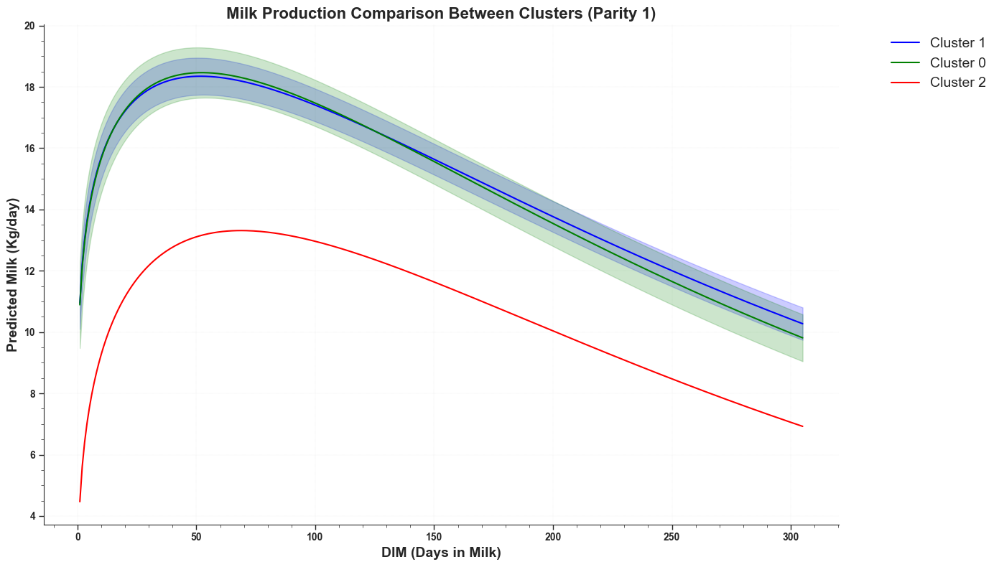

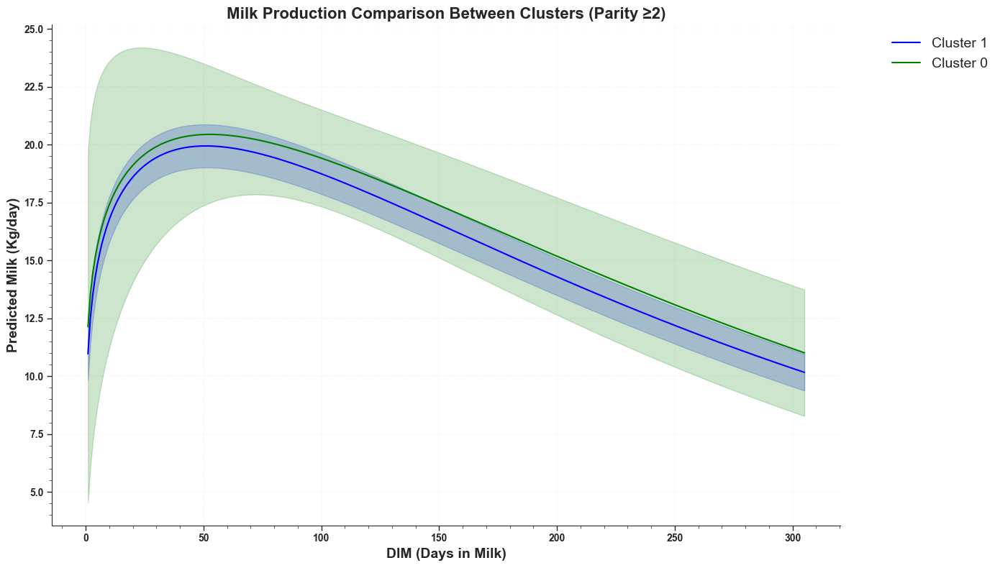

In [139]:
# Required Libraries
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

# Loading data set
data08 = pd.read_excel('woods_predicted_milk_clusters.xlsx')

# Check the first five rows of the data set
print(data08.head())

# Check column names to confirm proper variable names
print(data08.columns)

# Ensure there are no leading or trailing spaces in column names
data08.columns = data08.columns.str.strip()

# Define the parity values
parity_values = [1, 2]

# Function to plot mean and 95% CI for clusters with specific colors
def plot_with_ci(subset, x_column, y_column, cluster_label):
    # Set color for each cluster
    colors = {0: 'green', 1: 'blue', 2: 'red'}
    color = colors[cluster_label]

    # Calculate mean, standard deviation, and count values for the specified x and y columns
    means = subset.groupby(x_column)[y_column].mean()
    stds = subset.groupby(x_column)[y_column].std()
    counts = subset.groupby(x_column)[y_column].count()

    # Plotting the mean line with the specified cluster color
    plt.plot(means.index, means, label=f'Cluster {cluster_label}', color=color)

    # Calculating the 95% CI and plotting it
    if len(counts) > 1:
        ci_upper = means + stats.t.ppf(0.975, counts - 1) * stds / np.sqrt(counts)
        ci_lower = means - stats.t.ppf(0.975, counts - 1) * stds / np.sqrt(counts)
        plt.fill_between(means.index, ci_lower, ci_upper, alpha=0.2, color=color)
    else:
        print(f"Not enough data points to calculate CI for Cluster {cluster_label}")

# Setting seaborn style for improved aesthetics
sns.set_style("ticks")

# Create a folder for saving figures
output_folder = "Lactation Curve Figures"
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Loop over each parity group to create separate plots
for parity in parity_values:
    # Set figure size
    plt.figure(figsize=(14, 8))

    # Filter data based on parity
    subset = data08[data08['Parity'] == parity]

    # Loop over each cluster within the subset and plot with 95% CI
    for cluster in subset['Cluster'].unique():
        cluster_data = subset[subset['Cluster'] == cluster]
        plot_with_ci(cluster_data, 'DIM', 'Predicted Milk', cluster)

    # Plot title and labels
    title_parity = f'Parity {parity}' if parity == 1 else 'Parity ≥2'
    plt.title(f'Milk Production Comparison Between Clusters ({title_parity})', fontsize=16, fontweight='bold')
    plt.xlabel('DIM (Days in Milk)', fontsize=14, fontweight='bold')
    plt.ylabel('Predicted Milk (Kg/day)', fontsize=14, fontweight='bold')
    plt.xticks(fontsize=14, fontweight='bold')
    plt.yticks(fontsize=14, fontweight='bold')

    # Legend settings
    plt.legend(fontsize=14, loc='upper left', bbox_to_anchor=(1.05, 1), frameon=False)

    # Remove upper and right spines
    sns.despine()

    # Grid style for better readability
    plt.grid(True, color='lightgray', linestyle=':', linewidth=0.25)

    # Set major and minor ticks
    plt.minorticks_on()
    plt.tick_params(axis='both', which='major', labelsize=10, width=1, length=5)
    plt.tick_params(axis='both', which='minor', labelsize=8, width=0.5, length=3)

    # Tight layout for optimal spacing
    plt.tight_layout()

    # Save the figure in the output folder
    output_file = os.path.join(output_folder, f'Lactation_Curve_Parity_{parity}.png')
    plt.savefig(output_file, dpi=600)

    # Display the figure
    plt.show()


# Part 08: Final Data Set Preparation for SPSS 

In [6]:
# loading data set
data09 = pd.read_excel('clusters.results.xlsx')

In [7]:
# Printing columns and variables in data set
print(data09.columns)

Index(['Cow ID', 'Lactation No', 'Parity', 'DIM At Peak Observed',
       'Peak Yield Observed', 'Persistency Observed', 'MY 56 Observed',
       'MY 84 Observed', 'MY 126 Observed', 'MY 305 Observed',
       'DIM 1st Service', 'DIM At Last Service', 'DIM At Conception',
       'No of Service Per Conception', 'DIM At First Heat',
       'DIM At First Sick', 'Health Problem First Sick', 'DIM At Second Sick',
       'Health Problem Second Sick', 'a', 'b', 'c', 'Predicted Peak Time',
       'Predicted Peak Yield', 'Predicted_persistency', 'MY 56 Predicted',
       'MY 84 Predicted', 'MY 126 Predicted', 'MY 305 Predicted', 'Cluster'],
      dtype='object')


# Data Manipulation and Wrangling

## Variable 1: Pregnancy At 100 Days

In [8]:
# Creating New variable: 'Pregnancy At 100 Days"
data09['Pregnancy 100 Days'] = data09['DIM At Conception'].apply(lambda x: x if x <= 100 else 100)
# Creating Status variable for 'Pregnancy At 100 Days'
data09['Pregnancy 100 Days Status'] = data09['DIM At Conception'].apply(lambda x: 1 if x <= 100 else 0)

## Variable 2: Pregnancy At 150 Days

In [9]:
# Creating New variable: 'Pregnancy At 150 Days"
data09['Pregnancy 150 Days'] = data09['DIM At Conception'].apply(lambda x: x if x <= 150 else 150)
# Creating Status variable for 'Pregnancy At 150 Days'
data09['Pregnancy 150 Days Status'] = data09['DIM At Conception'].apply(lambda x: 1 if x <= 150 else 0)

## Variable 3: Pregnancy At 200 Days

In [10]:
# Creating New variable: 'Pregnancy At 200 Days"
data09['Pregnancy 200 Days'] = data09['DIM At Conception'].apply(lambda x: x if x <= 200 else 200)
# Creating Status variable for 'Pregnancy At 200 Days'
data09['Pregnancy 200 Days Status'] = data09['DIM At Conception'].apply(lambda x: 1 if x <= 200 else 0)

## Varibale 4: First Sick At 250 Days

In [11]:
# Creating New variable: "First Sick At 2500 Days"
data09['1st Sick 250 Days'] = data09['DIM At First Sick'].apply(lambda x: x if x <= 250 else 250)
# Creating Status variable for 'First Sick At 250 Days'
data09['1st Sick Status 250 Days'] = data09['DIM At First Sick'].apply(lambda x: 1 if x <= 250 else 0)

## Variable 5: Second Sick At 250 Days

In [12]:
# Creating New variable: "Second Sick At 250 Days"
data09['2nd Sick 250 Days'] = data09['DIM At Second Sick'].apply(lambda x: x if x <= 250 else 250)
# Creating Status variable for 'Second Sick At 250 Days'
data09['2nd Sick Status 250 Days'] = data09['DIM At Second Sick'].apply(lambda x: 1 if x <= 250 else 0)

## Variable 6: First Heat At 40 Days

In [13]:
# Creating the '1st Heat 40 Days' variable
data09['1st Heat 40 Days'] = data09['DIM At First Heat'].apply(lambda x: x if x <= 40 else 40)
# Creating the Status variable for '1st Heat 40 Days' variable
data09['1st Heat Status 40 Days'] = data09['DIM At First Heat'].apply(lambda x: 1 if x <= 40 else 0)

## Variable 7: First Heat At 60 Days

In [14]:
# Creating the '1st Heat 60 Days' variable
data09['1st Heat 60 Days'] = data09['DIM At First Heat'].apply(lambda x: x if x <= 60 else 60)
# Creating the Status variable for '1st Heat 60 Days' variable
data09['1st Heat Status 60 Days'] = data09['DIM At First Heat'].apply(lambda x: 1 if x <= 60 else 0)

## Variable 8: First Heat At 90 Days

In [15]:
# Creating the '1st Heat 90 Days' variable
data09['1st Heat 90 Days'] = data09['DIM At First Heat'].apply(lambda x: x if x <= 90 else 90)
# Creating the Status variable for '1st Heat 90 Days' variable
data09['1st Heat Status 90 Days'] = data09['DIM At First Heat'].apply(lambda x: 1 if x <= 90 else 0)

## Variable 9: First Service At 60 Days

In [16]:
# Creating the '1st Service At 60 Days' variable
data09['1st Service 60 Days '] = data09['DIM 1st Service'].apply(lambda x: x if x <= 60 else 60)
# Creating the Status variable for '1st Serivce At 60 Days'
data09['1st Service Status 60 Days'] = data09['DIM 1st Service'].apply(lambda x: 1 if x <= 60 else 0)

## Variable 10: First Service At 90 Days

In [17]:
# Creating the '1st Service At 90 Days' variable
data09['1st Service 90 Days '] = data09['DIM 1st Service'].apply(lambda x: x if x <= 90 else 90)
# Creating the Status variable for '1st Service At 90 Days'
data09['1st Service Status 90 Days'] = data09['DIM 1st Service'].apply(lambda x: 1 if x <= 90 else 0)

## Variable 11: First Service At 120 Days

In [18]:
# Creating the '1st Service At 120 Days' variable
data09['1st Service 120 Days '] = data09['DIM 1st Service'].apply(lambda x: x if x <= 120 else 120)
# Creating the Status variable for '1st Service At 90 Days'
data09['1st Service Status 120 Days'] = data09['DIM 1st Service'].apply(lambda x: 1 if x <= 120 else 0)

## Saving Results

In [19]:
# Saving Results
data09.to_excel('cluster.results.final.xlsx', index=False)

In [20]:
data10 = pd.read_excel('cluster.results.final.xlsx')

In [21]:
data10.columns

Index(['Cow ID', 'Lactation No', 'Parity', 'DIM At Peak Observed',
       'Peak Yield Observed', 'Persistency Observed', 'MY 56 Observed',
       'MY 84 Observed', 'MY 126 Observed', 'MY 305 Observed',
       'DIM 1st Service', 'DIM At Last Service', 'DIM At Conception',
       'No of Service Per Conception', 'DIM At First Heat',
       'DIM At First Sick', 'Health Problem First Sick', 'DIM At Second Sick',
       'Health Problem Second Sick', 'a', 'b', 'c', 'Predicted Peak Time',
       'Predicted Peak Yield', 'Predicted_persistency', 'MY 56 Predicted',
       'MY 84 Predicted', 'MY 126 Predicted', 'MY 305 Predicted', 'Cluster',
       'Pregnancy 100 Days', 'Pregnancy 100 Days Status', 'Pregnancy 150 Days',
       'Pregnancy 150 Days Status', 'Pregnancy 200 Days',
       'Pregnancy 200 Days Status', '1st Sick 250 Days',
       '1st Sick Status 250 Days', '2nd Sick 250 Days',
       '2nd Sick Status 250 Days', '1st Heat 40 Days',
       '1st Heat Status 40 Days', '1st Heat 60 Days',
  

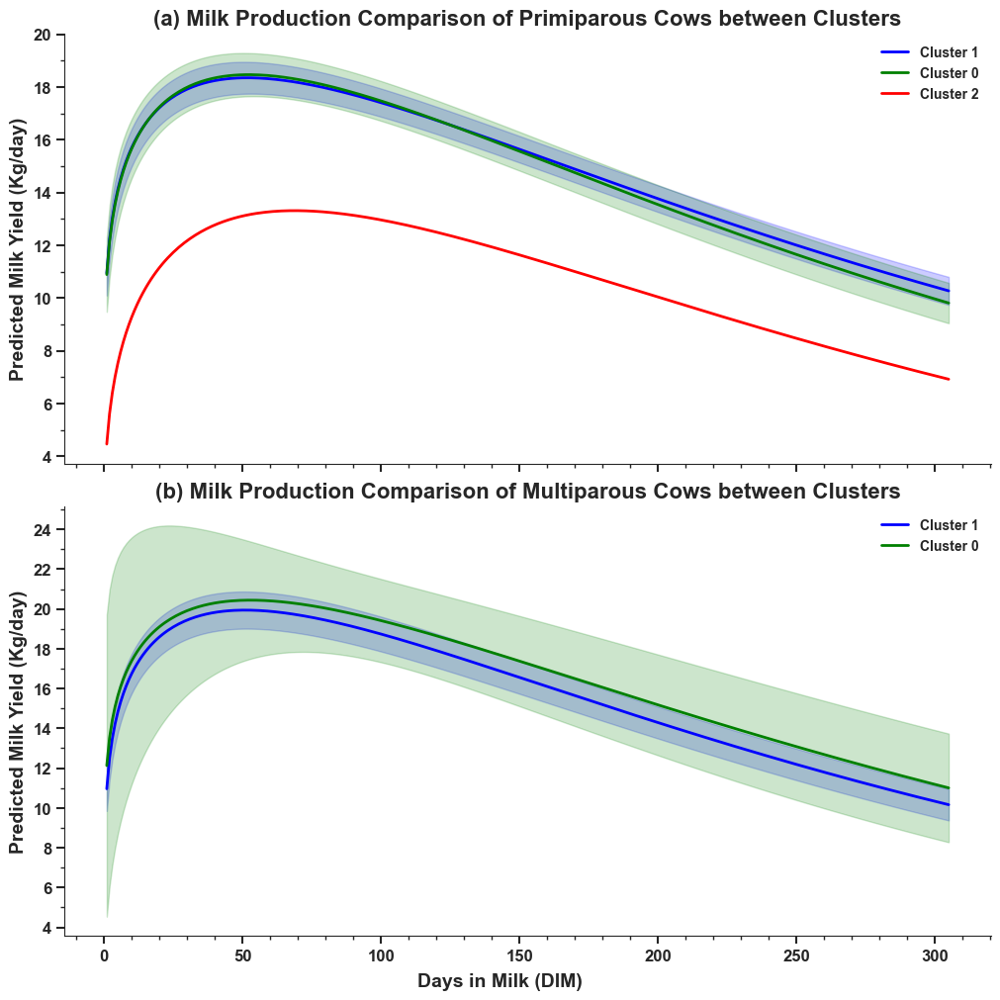

Figure saved successfully at: Lactation_Curve_Figures\Lactation_Curve_Comparison.jpg


In [3]:
# Required Libraries
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from matplotlib.ticker import MultipleLocator

# Load the dataset
data08 = pd.read_excel('woods_predicted_milk_clusters.xlsx')

# Ensure there are no leading or trailing spaces in column names
data08.columns = data08.columns.str.strip()

# Define parity values
parity_values = [1, 2]

# Function to plot mean and 95% CI for clusters with specific colors
def plot_with_ci(subset, x_column, y_column, cluster_label):
    colors = {0: 'green', 1: 'blue', 2: 'red'}
    color = colors.get(cluster_label, 'gray')

    # Calculate mean, std, and confidence intervals
    means = subset.groupby(x_column)[y_column].mean()
    stds = subset.groupby(x_column)[y_column].std()
    counts = subset.groupby(x_column)[y_column].count()

    plt.plot(means.index, means, label=f'Cluster {cluster_label}', color=color, lw=2)
    if len(counts) > 1:
        ci_upper = means + stats.t.ppf(0.975, counts - 1) * stds / np.sqrt(counts)
        ci_lower = means - stats.t.ppf(0.975, counts - 1) * stds / np.sqrt(counts)
        plt.fill_between(means.index, ci_lower, ci_upper, alpha=0.2, color=color)

# Seaborn and Matplotlib Settings
sns.set_style("ticks")

# Output folder for saving figures
output_folder = "Lactation_Curve_Figures"
os.makedirs(output_folder, exist_ok=True)

# Create a figure with two subplots
fig, axes = plt.subplots(2, 1, figsize=(10, 10), sharex=True, constrained_layout=True)
fig.patch.set_facecolor('white')  # White background

# Titles for the subplots
titles = [
    "(a) Milk Production Comparison of Primiparous Cows between Clusters",
    "(b) Milk Production Comparison of Multiparous Cows between Clusters"
]

# Loop over parity groups and axes
for i, (parity, ax) in enumerate(zip(parity_values, axes)):
    plt.sca(ax)
    subset = data08[data08['Parity'] == parity]

    # Plot data for each cluster
    for cluster in subset['Cluster'].unique():
        cluster_data = subset[subset['Cluster'] == cluster]
        plot_with_ci(cluster_data, 'DIM', 'Predicted Milk', cluster)

    # Titles, labels, and ticks
    ax.set_title(titles[i], fontsize=16, fontweight='bold')
    ax.set_ylabel('Predicted Milk Yield (Kg/day)', fontsize=14, fontweight='bold')
    ax.xaxis.set_major_locator(MultipleLocator(50))  # Major ticks every 50 units
    ax.xaxis.set_minor_locator(MultipleLocator(10))  # Minor ticks every 10 units
    ax.yaxis.set_major_locator(MultipleLocator(2))   # Major ticks every 2 units on y-axis
    ax.yaxis.set_minor_locator(MultipleLocator(1))   # Minor ticks every 1 unit on y-axis

    # Customize ticks with bold font
    plt.setp(ax.get_xticklabels(), fontweight='bold', fontsize=12)
    plt.setp(ax.get_yticklabels(), fontweight='bold', fontsize=12)
    ax.tick_params(axis='both', which='major', length=6, width=1.5)
    ax.tick_params(axis='both', which='minor', length=3, width=1)

    # Bold legend at top-right without a title
    ax.legend(fontsize=10, loc='upper right', frameon=False, prop={'weight': 'bold'})

    # Remove grid and spines for clean look
    sns.despine(ax=ax)
    ax.grid(False)

# Shared x-axis label
fig.supxlabel('Days in Milk (DIM)', fontsize=14, fontweight='bold')

# Save the figure
output_file = os.path.join(output_folder, "Lactation_Curve_Comparison.jpg")
plt.savefig(output_file, dpi=600, format='jpg', facecolor='white')
plt.show()

print(f"Figure saved successfully at: {output_file}")
